In [3]:
import os
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import numpy as np
import zarr
import tqdm
import shutil
import dask.array as da
import cupy as cp
import helpers

In [ ]:
class MRI_Motion_Dataset(Dataset):
    string = True
    def __init__(self, moving_zarr_path : str, fixed_zarr_path : str):
        super().__init__()
        self.moving_zarr_array = zarr.open(moving_zarr_path, mode='r')
        self.fixed_zarr_array = zarr.open(fixed_zarr_path, mode='r')
        assert self.moving_zarr_array.shape[3] == self.fixed_zarr_array.shape[3]
        self.num_images = self.moving_zarr_array.shape[3]
        self.original_shape = self.fixed_zarr_array.shape[:3] # H, W, D
        self.padded_shape = list(self.original_shape)
        for i in range(3):
            if self.padded_shape[i] % 4 != 0:
                self.padded_shape[i] = (self.padded_shape[i] // 4 + 1) * 4
        self.input_shape = (self.padded_shape[2], self.padded_shape[0], self.padded_shape[1]) # D, H, W
        print(f"Dataset initialisiert. Original H,W,D: {self.original_shape}. Padded H,W,D: {self.padded_shape}")
        
    def __init__(self, moving_zarr : zarr.array, fixed_zarr : zarr.array):
        super().__init__()
        self.string = False
        self.moving_zarr_array = moving_zarr
        self.fixed_zarr_array = fixed_zarr
        assert self.moving_zarr_array.shape[3] == self.fixed_zarr_array.shape[3]
        self.num_images = self.moving_zarr_array.shape[3]
        self.original_shape = self.fixed_zarr_array.shape[:3] # H, W, D
        self.padded_shape = list(self.original_shape)
        for i in range(3):
            if self.padded_shape[i] % 4 != 0:
                self.padded_shape[i] = (self.padded_shape[i] // 4 + 1) * 4
        self.input_shape = (self.padded_shape[2], self.padded_shape[0], self.padded_shape[1]) # D, H, W
        print(f"Dataset initialisiert. Original H,W,D: {self.original_shape}. Padded H,W,D: {self.padded_shape}")

    def __len__(self):
        return self.num_images

    def __getitem__(self, idx):
        if(self.string):
            moving_np = self.moving_zarr_array[..., idx]
            fixed_np = self.fixed_zarr_array[..., idx]
            moving_vol = torch.from_numpy(moving_np.astype(np.float32)).permute(2,0,1).unsqueeze(0)
            fixed_vol = torch.from_numpy(fixed_np.astype(np.float32)).permute(2,0,1).unsqueeze(0)
            pad_d = self.padded_shape[2]-moving_vol.shape[1]
            pad_h = self.padded_shape[0]-moving_vol.shape[2]
            pad_w = self.padded_shape[1]-moving_vol.shape[3]
            padding = (pad_w//2, pad_w-pad_w//2, pad_h//2, pad_h-pad_h//2, pad_d//2, pad_d-pad_d//2)
            return F.pad(moving_vol, padding), F.pad(fixed_vol, padding)
        else:
            moving = self.moving_zarr_array[..., idx][:]
            fixed = self.fixed_zarr_array[..., idx][:]
            moving_np = moving.compute()
            fixed_np = fixed
            moving_vol = torch.from_numpy(moving_np.astype(np.float32)).permute(2,0,1).unsqueeze(0)
            fixed_vol = torch.from_numpy(fixed_np.astype(np.float32)).permute(2,0,1).unsqueeze(0)
            pad_d = self.padded_shape[2]-moving_vol.shape[1]
            pad_h = self.padded_shape[0]-moving_vol.shape[2]
            pad_w = self.padded_shape[1]-moving_vol.shape[3]
            padding = (pad_w//2, pad_w-pad_w//2, pad_h//2, pad_h-pad_h//2, pad_d//2, pad_d-pad_d//2)
            return F.pad(moving_vol, padding), F.pad(fixed_vol, padding)

class SpatialTransformer3D(nn.Module):
    def __init__(self, size):
        super().__init__()
        vectors = [torch.arange(0, s) for s in size]
        grids = torch.meshgrid(vectors, indexing='ij')
        grid = torch.stack(grids)
        self.register_buffer('grid', grid.unsqueeze(0).float(), persistent=False)

    def forward(self, src, flow):
        new_locs = self.grid + flow
        shape = flow.shape[2:]
        for i in range(len(shape)):
            new_locs[:, i, ...] = 2 * (new_locs[:, i, ...] / (shape[i] - 1) - 0.5)
        new_locs = new_locs.permute(0, 2, 3, 4, 1)[..., [2, 1, 0]]
        return F.grid_sample(src, new_locs, align_corners=True, padding_mode="border")

class UNet3D(nn.Module):
    def __init__(self, in_channels=2, out_channels=3):
        super().__init__()
        self.enc1 = self._conv_block(in_channels, 16)
        self.enc2 = self._conv_block(16, 32)
        self.pool = nn.MaxPool3d(2)
        self.bottleneck = self._conv_block(32, 64)
        self.upconv2 = nn.ConvTranspose3d(64, 32, kernel_size=2, stride=2)
        self.dec2 = self._conv_block(64, 32)
        self.upconv1 = nn.ConvTranspose3d(32, 16, kernel_size=2, stride=2)
        self.dec1 = self._conv_block(32, 16)
        self.final_conv = nn.Conv3d(16, out_channels, kernel_size=1)
        self.final_conv.weight.data.zero_()
        self.final_conv.bias.data.zero_()

    def _conv_block(self, in_c, out_c):
        return nn.Sequential(
            nn.Conv3d(in_c, out_c, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv3d(out_c, out_c, kernel_size=3, padding=1),
            nn.ReLU(inplace=True)
        )

    def forward(self, x_fixed, x_moving):
        x = torch.cat([x_fixed, x_moving], dim=1)
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        b = self.bottleneck(self.pool(e2))
        d2 = self.upconv2(b)
        if d2.shape[2:] != e2.shape[2:]:
            d2 = F.interpolate(d2, size=e2.shape[2:], mode='trilinear', align_corners=False)
        d2 = torch.cat([d2, e2], dim=1)
        d2 = self.dec2(d2)
        d1 = self.upconv1(d2)
        if d1.shape[2:] != e1.shape[2:]:
            d1 = F.interpolate(d1, size=e1.shape[2:], mode='trilinear', align_corners=False)
        d1 = torch.cat([d1, e1], dim=1)
        d1 = self.dec1(d1)
        return self.final_conv(d1)

class RegistrationModel(nn.Module):
    def __init__(self, input_size):
        super().__init__()
        self.registration_net = UNet3D()
        self.spatial_transformer = SpatialTransformer3D(size=input_size)

    def forward(self, moving, fixed):
        displacement_field = self.registration_net(fixed, moving)
        warped_moving = self.spatial_transformer(moving, displacement_field)
        return warped_moving, displacement_field

In [5]:
DATASET_NAME = '159269_B1'
PART = '14'

In [ ]:
dicom_folder = f'/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/Raw_Datasets/{DATASET_NAME}/{PART}/DICOM' 
zarr_file = f'/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/Raw_Datasets/{DATASET_NAME}/{PART}/{DATASET_NAME}_{PART}.zarr'
file_path = f'/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/Raw_Datasets/{DATASET_NAME}/{PART}/AIF_2.txt'
results_path = f'/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/MRI-Datasets/MoCoCo/{DATASET_NAME}_{PART}_warped/'
results_path = f'/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/MRI-Datasets/MoCoCo/{DATASET_NAME}_{PART}_dpf/'

In [7]:
temp_zarr = f'/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/Raw_Datasets/{DATASET_NAME}/{PART}/{DATASET_NAME}_{PART}_correct_shape.zarr'

In [ ]:
input_array = da.from_zarr(zarr_file)

H, W = 256, 256
D = 50
T = 250

assert D * T == input_array.shape[0], "Die Dimensionen passen nicht zusammen!"

reshaped_array = input_array.reshape(T, D, H, W)
print(f"Form nach dem Reshape: {reshaped_array.shape}  (entspricht T, D, H, W)")
final_array = reshaped_array.transpose(2, 3, 1, 0)
print(f"Form des finalen Arrays: {final_array.shape} (entspricht H, W, D, T)")

final_array.to_zarr(temp_zarr, overwrite=True)

Form nach dem Reshape: (250, 50, 256, 256)  (entspricht T, D, H, W)
Form des finalen Arrays: (256, 256, 50, 250) (entspricht H, W, D, T)


In [9]:
FIXED_ZARR_PATH = "/mnt/dev_rep/repos/MRI-MoCoCo/DCE_codeset/MRI-Datasets/mdreg_DCE_fitting_results/fit_zarr_2.zarr"

In [10]:
seriesNumber = len(final_array[0,0,0,:])
seriesNumber

250

In [11]:
fixed_dataset = zarr.open(FIXED_ZARR_PATH)
fixed_dataset = fixed_dataset[:,:,:,0:seriesNumber]
fixed_dataset = cp.transpose(fixed_dataset, [1,0,2,3])
fixed_dataset 

array([[[[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]],

        ...,

        [[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
    

In [12]:
MODEL_PATH = "./best_registration_model.pth"
OUTPUT_WARPED_PATH = results_path
OUTPUT_DVF_PATH = "validation_displacement_fields.zarr"

BATCH_SIZE = 6

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Verwende Gerät: {device}")

full_dataset = MRI_Motion_Dataset(moving_zarr=final_array, fixed_zarr=fixed_dataset)

val_dataset = full_dataset
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
print(f"Validierungs-Set mit {len(val_dataset)} Bildern ist bereit für die Inferenz.")

input_size = full_dataset.input_shape
model = RegistrationModel(input_size=input_size).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()
print(f"Modell von '{MODEL_PATH}' geladen.")

H, W, D = full_dataset.original_shape
num_val_images = len(val_dataset)

for path in [OUTPUT_WARPED_PATH, OUTPUT_DVF_PATH]:
    if os.path.exists(path):
        shutil.rmtree(path)

output_warped_valid_zarr = zarr.open(OUTPUT_WARPED_PATH, mode='w',
                               shape=(H, W, D, num_val_images),
                               chunks=(H, W, D, 1),
                               dtype=full_dataset.moving_zarr_array.dtype)

output_dvf_valid_zarr = zarr.open(OUTPUT_DVF_PATH, mode='w',
                            shape=(H, W, D, num_val_images, 3),
                            chunks=(H, W, D, 1, 3),
                            dtype='float32')

print(f"Output-Dateien für {num_val_images} Validierungsbilder erstellt.")

current_index = 0
with torch.no_grad(): 
    progress_bar = tqdm.tqdm(val_loader, desc="Prozessiere Validierungs-Set")
    for moving_batch, fixed_batch in progress_bar:
        moving_batch, fixed_batch = moving_batch.to(device), fixed_batch.to(device)

        warped_batch, displacement_batch = model(moving_batch, fixed_batch)

        warped_batch_cpu = warped_batch.cpu()
        displacement_batch_cpu = displacement_batch.cpu()
        batch_size_current = warped_batch_cpu.shape[0]

        for j in range(batch_size_current):
            warped_tensor = warped_batch_cpu[j]
            dvf_tensor = displacement_batch_cpu[j]

            pad_d, pad_h, pad_w = full_dataset.padded_shape[2]-D, full_dataset.padded_shape[0]-H, full_dataset.padded_shape[1]-W
            cropped_warped = warped_tensor[:, pad_d//2:pad_d//2+D, pad_h//2:pad_h//2+H, pad_w//2:pad_w//2+W]
            cropped_dvf = dvf_tensor[:, pad_d//2:pad_d//2+D, pad_h//2:pad_h//2+H, pad_w//2:pad_w//2+W]

            warped_np = cropped_warped.squeeze(0).numpy().transpose(1, 2, 0)
            dvf_np = cropped_dvf.permute(2, 3, 1, 0).numpy()

            idx_to_save = current_index + j
            output_warped_valid_zarr[..., idx_to_save] = warped_np
            output_dvf_valid_zarr[..., idx_to_save, :] = dvf_np

        current_index += batch_size_current

print(f"\nValidierung abgeschlossen.")
print(f"Die {num_val_images} korrigierten Validierungsbilder wurden gespeichert in: '{OUTPUT_WARPED_PATH}'")
print(f"Die zugehörigen Displacement Fields wurden gespeichert in: '{OUTPUT_DVF_PATH}'")

Verwende Gerät: cuda
Dataset initialisiert. Original H,W,D: (256, 256, 50). Padded H,W,D: [256, 256, 52]
Validierungs-Set mit 250 Bildern ist bereit für die Inferenz.
Modell von './best_registration_model.pth' geladen.
Output-Dateien für 250 Validierungsbilder erstellt.


Prozessiere Validierungs-Set: 100%|██████████| 42/42 [03:16<00:00,  4.69s/it]


Validierung abgeschlossen.
Die 250 korrigierten Validierungsbilder wurden gespeichert in: '/mnt/dev_rep/repos/MRI-MoCoCo/ready_to_use/MRI-Datasets/MoCoCo/159269_B1_14_dpf/'
Die zugehörigen Displacement Fields wurden gespeichert in: 'validation_displacement_fields.zarr'


In [15]:
final= fixed_dataset[:,:,23,:]
final = cp.transpose(final, [2,0,1])

In [ ]:
helpers.explore_3D_array(final)

interactive(children=(IntSlider(value=124, description='SLICE', max=249), Output()), _dom_classes=('widget-int…

In [ ]:
MOVING_ZARR_PATH = temp_zarr 
MODEL_PATH = "./best_registration_model.pth"
OUTPUT_WARPED_PATH = "self_corrected_images.zarr"

FIXED_REFERENCE_INDEX = 42
BATCH_SIZE = 1 

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Verwende Gerät: {device}")

moving_full_array = final_array 
H, W, D, T = moving_full_array.shape
original_shape = (H, W, D)

padded_shape = list(original_shape)
for i in range(3):
    if padded_shape[i] % 4 != 0:
        padded_shape[i] = (padded_shape[i] // 4 + 1) * 4
input_size_stn = (padded_shape[2], padded_shape[0], padded_shape[1]) # D, H, W für STN
print(f"Original H,W,D: {original_shape}. Padded H,W,D: {padded_shape}")

model = RegistrationModel(input_size=input_size_stn).to(device)
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()
print(f"Modell von '{MODEL_PATH}' geladen.")

def preprocess_volume(volume_np, padded_shape_list):
    """Konvertiert NumPy (H, W, D) zu Tensor (1, 1, D, H, W) und paddet."""
    tensor = torch.from_numpy(volume_np.astype(np.float32)).permute(2, 0, 1).unsqueeze(0) # 1, D, H, W
    pad_d = padded_shape_list[2] - tensor.shape[1]
    pad_h = padded_shape_list[0] - tensor.shape[2]
    pad_w = padded_shape_list[1] - tensor.shape[3]
    padding = (pad_w//2, pad_w-pad_w//2, pad_h//2, pad_h-pad_h//2, pad_d//2, pad_d-pad_d//2)
    return F.pad(tensor, padding).unsqueeze(0) # 1, 1, D_pad, H_pad, W_pad

print(f"Lade Referenzbild (Index {FIXED_REFERENCE_INDEX})...")
fixed_dask_slice = moving_full_array[..., FIXED_REFERENCE_INDEX]
fixed_np = fixed_dask_slice.compute()
# --------------------------------------------------
fixed_tensor_batch = preprocess_volume(fixed_np, padded_shape).to(device)
print("Referenzbild ist auf dem Gerät.")

if os.path.exists(OUTPUT_WARPED_PATH): shutil.rmtree(OUTPUT_WARPED_PATH)
# if os.path.exists(OUTPUT_DVF_PATH): shutil.rmtree(OUTPUT_DVF_PATH)

output_warped_zarr = zarr.open(OUTPUT_WARPED_PATH, mode='w',
                               shape=(H, W, D, T),
                               chunks=(H, W, D, 1),
                               dtype=moving_full_array.dtype,
                               compressor=None, 
                               zarr_version=2) 

print(f"Output-Datei für korrigierte Bilder erstellt: {OUTPUT_WARPED_PATH}")

with torch.no_grad():
    progress_bar = tqdm.tqdm(range(T), desc="Korrigiere Bildserie")
    for t in progress_bar:
        moving_dask_slice = moving_full_array[..., t]
        moving_np = moving_dask_slice.compute() 
        
        moving_tensor_batch = preprocess_volume(moving_np, padded_shape).to(device)
        warped_batch, displacement_batch = model(moving_tensor_batch, fixed_tensor_batch)

        warped_batch_cpu = warped_batch.cpu()
        # displacement_batch_cpu = displacement_batch.cpu()

        warped_tensor = warped_batch_cpu[0] 
        # dvf_tensor = displacement_batch_cpu[0]

        pad_d = padded_shape[2] - D
        pad_h = padded_shape[0] - H
        pad_w = padded_shape[1] - W
        cropped_warped = warped_tensor[:, pad_d//2 : pad_d//2 + D, pad_h//2 : pad_h//2 + H, pad_w//2 : pad_w//2 + W]
        # cropped_dvf = ...

        # H, W, D
        warped_np = cropped_warped.squeeze(0).numpy().transpose(1, 2, 0)
        # dvf_np = ...
        
        output_warped_zarr[..., t] = warped_np
        # output_dvf_zarr[..., t, :] = dvf_np

print(f"\nVerarbeitung abgeschlossen.")
print(f"Die selbst-korrigierte Bildserie wurde gespeichert in: '{OUTPUT_WARPED_PATH}'")
# print(f"Die Displacement Fields wurden gespeichert in: '{OUTPUT_DVF_PATH}'")

Verwende Gerät: cuda
Original H,W,D: (256, 256, 50). Padded H,W,D: [256, 256, 52]
Modell von './best_registration_model.pth' geladen.
Lade Referenzbild (Index 42)...
Referenzbild ist auf dem Gerät.
Output-Datei für korrigierte Bilder erstellt: self_corrected_images.zarr


Korrigiere Bildserie: 100%|██████████| 250/250 [00:32<00:00,  7.77it/s]


✅ Verarbeitung abgeschlossen.
Die selbst-korrigierte Bildserie wurde gespeichert in: 'self_corrected_images.zarr'


In [16]:
slice = 22

In [17]:
from ipywidgets import interact, IntSlider
import matplotlib.pyplot as plt

def explore_3D_array_comparison_with_diff(
    arr1: np.ndarray, 
    arr2: np.ndarray, 
    arr3: np.ndarray, 
    cmap: str = 'gray'
):
    """
    Erstellt ein interaktives Widget, um Slices aus drei 3D-Arrays zu vergleichen.
    Zeigt die drei Bilder nebeneinander an und berechnet zusätzlich die absolute 
    Differenz zwischen dem zweiten (mittleren) und dritten (rechten) Bild.

    Args:
      arr1: Erstes 3D-Array (links), z.B. das Originalbild.
      arr2: Zweites 3D-Array (mitte), z.B. nach einer ersten Transformation.
      arr3: Drittes 3D-Array (rechts), z.B. nach einer zweiten Transformation.
      cmap: Farbkarte für die Darstellung der Bilder.
    """
    assert arr1.shape == arr2.shape == arr3.shape, "Alle drei Arrays müssen exakt die gleiche Form haben."

    diff_arr = np.absolute(arr2 - arr3)

    def fn(SLICE):
        fig, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, sharex='col', sharey='row', figsize=(20, 7))

        ax1.set_title('Image 1 (Left)', fontsize=15)
        ax1.imshow(arr1[SLICE, :, :], cmap=cmap)
        ax1.axis('off')

        ax2.set_title('Image 2 (Middle)', fontsize=15)
        ax2.imshow(arr2[SLICE, :, :], cmap=cmap)
        ax2.axis('off')

        ax3.set_title('Image 3 (Right)', fontsize=15)
        ax3.imshow(arr3[SLICE, :, :], cmap=cmap)
        ax3.axis('off')

        ax4.set_title('Difference (|Middle - Right|)', fontsize=15)
        im4 = ax4.imshow(diff_arr[SLICE, :, :], cmap='magma')
        ax4.axis('off')

        plt.tight_layout()
        plt.show()
    
    interact(fn, SLICE=IntSlider(min=0, max=arr1.shape[0]-1, step=1, value=arr1.shape[0]//2, description='Slice:'))


In [ ]:
# %% Notwendige Importe
import numpy as np
import matplotlib.pyplot as plt

# T, W, H
def visualize_time_window_comparison_TWH(
    moving_arr: np.ndarray,
    warped_arr: np.ndarray,
    mdreg_arr: np.ndarray,
    t_start: int,
    *,
    cmap: str = 'gray' 
):
    """
    Erstellt einen Plot, der Slices aus drei 3D-Arrays (T, W, H) 
    über ein Zeitfenster von 15 Bildern vergleicht.
    Zeigt Moving, Warped, mdreg und zwei Differenzbilder für jeden Zeitpunkt an.

    Args:
      moving_arr: Originale 'Moving' Bildserie (T, W, H).
      warped_arr: Von Ihrem Modell korrigierte Bildserie (T, W, H).
      mdreg_arr: Mit mdreg korrigierte Bildserie (T, W, H).
      t_start: Der Startzeitpunkt für das 15-Bilder-Fenster.
      cmap: Farbkarte für die Darstellung der Bilder.
    """
    assert moving_arr.shape == warped_arr.shape == mdreg_arr.shape, "Alle drei Arrays müssen exakt die gleiche Form haben."
    assert moving_arr.ndim == 3, "Eingabearrays müssen 3-dimensional sein (T, W, H)."
    
    T, W, H = moving_arr.shape
    num_frames = 15
    t_end = min(t_start + num_frames, T)
    actual_frames = t_end - t_start

    if actual_frames <= 0:
        print(f"FEHLER: Startzeitpunkt {t_start} liegt außerhalb der gültigen Zeitreihe (Länge {T}).")
        return

    fig, axes = plt.subplots(actual_frames, 5, figsize=(20, 3 * actual_frames), 
                             sharex=True, sharey=True)
    
    if actual_frames == 1:
        axes = axes.reshape(1, -1)

    fig.suptitle(f"Vergleich von Zeitpunkten {t_start} bis {t_end-1}", fontsize=16, y=1.0)
    print(f"Zeige {actual_frames} Zeitpunkte von {t_start} bis {t_end-1} an...")

    max_diff_overall = 0
    diffs_mw = []
    diffs_wm = []
    for i in range(actual_frames):
        t = t_start + i
        slice_moving = moving_arr[t, :, :] 
        slice_warped = warped_arr[t, :, :]
        slice_mdreg = mdreg_arr[t, :, :]
        
        diff_mov_warp = np.absolute(slice_moving.astype(float) - slice_warped.astype(float))
        diff_warp_mdreg = np.absolute(slice_warped.astype(float) - slice_mdreg.astype(float))
        diffs_mw.append(diff_mov_warp)
        diffs_wm.append(diff_warp_mdreg)
        current_max = max(diff_mov_warp.max(), diff_warp_mdreg.max()) if diff_mov_warp.size > 0 else 0
        if current_max > max_diff_overall:
            max_diff_overall = current_max

    for i in range(actual_frames):
        t = t_start + i
        
        slice_moving = moving_arr[t, :, :]
        slice_warped = warped_arr[t, :, :]
        slice_mdreg = mdreg_arr[t, :, :]
        diff_mov_warp = diffs_mw[i]
        diff_warp_mdreg = diffs_wm[i]

        img_moving = slice_moving.T
        img_warped = slice_warped.T
        img_mdreg = slice_mdreg.T
        img_diff_mw = diff_mov_warp.T
        img_diff_wm = diff_warp_mdreg.T

        axes[i, 0].imshow(img_moving, cmap=cmap)
        axes[i, 0].set_ylabel(f'Time {t}', fontsize=12)

        axes[i, 1].imshow(img_warped, cmap=cmap)
        axes[i, 2].imshow(img_mdreg, cmap=cmap)
        axes[i, 3].imshow(img_diff_mw, cmap='inferno', vmin=0, vmax=max_diff_overall)
        axes[i, 4].imshow(img_diff_wm, cmap='inferno', vmin=0, vmax=max_diff_overall)

        if i == 0:
            axes[i, 0].set_title('Original (Moving)', fontsize=14)
            axes[i, 1].set_title('Warped (Unser Modell)', fontsize=14)
            axes[i, 2].set_title('mdreg Korrektur', fontsize=14)
            axes[i, 3].set_title('|Moving - Warped|', fontsize=14)
            axes[i, 4].set_title('|Warped - mdreg|', fontsize=14)
            
        for j in range(5):
            axes[i, j].set_xticks([])
            axes[i, j].set_yticks([])

    plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.95)
    plt.show()

In [19]:
output_dvf_valid_zarr

<Array file://validation_displacement_fields.zarr shape=(256, 256, 50, 250, 3) dtype=float32>

In [20]:
warped_complete = output_warped_zarr[:,:,slice,:]
warped_complete = cp.transpose(warped_complete, [2,0,1])

NameError: name 'output_warped_zarr' is not defined

In [78]:
moving_full = final_array[:,:,slice,:]
moving_full = cp.transpose(moving_full, [2,1,0])

In [ ]:
helpers.explore_3D_array_comparison_and_diff(final,warped_complete)

interactive(children=(IntSlider(value=125, description='Slice:', max=249), Output()), _dom_classes=('widget-in…

In [32]:
helpers.explore_3D_array_comparison_and_diff(warped_complete, original)

interactive(children=(IntSlider(value=500, description='Slice:', max=999), Output()), _dom_classes=('widget-in…

In [ ]:
# %% Notwendige Importe
import numpy as np
import matplotlib.pyplot as plt

# T, H, W
def visualize_time_window_comparison_THW(
    moving_arr: np.ndarray,
    warped_arr: np.ndarray,
    mdreg_arr: np.ndarray,
    t_start: int,
    *, 
    cmap: str = 'gray' 
):
    """
    Erstellt einen Plot, der Slices aus drei 3D-Arrays (T, H, W) 
    über ein Zeitfenster von 15 Bildern vergleicht.
    Zeigt Moving, Warped, mdreg und zwei Differenzbilder für jeden Zeitpunkt an.

    Args:
      moving_arr: Originale 'Moving' Bildserie (T, H, W).
      warped_arr: Von Ihrem Modell korrigierte Bildserie (T, H, W).
      mdreg_arr: Mit mdreg korrigierte Bildserie (T, H, W).
      t_start: Der Startzeitpunkt für das 15-Bilder-Fenster.
      cmap: Farbkarte für die Darstellung der Bilder.
    """
    assert moving_arr.shape == warped_arr.shape == mdreg_arr.shape, "Alle drei Arrays müssen exakt die gleiche Form haben."
    assert moving_arr.ndim == 3, "Eingabearrays müssen 3-dimensional sein (T, H, W)."
    
    T, H, W = moving_arr.shape
    num_frames = 15
    t_end = min(t_start + num_frames, T)
    actual_frames = t_end - t_start

    if actual_frames <= 0:
        print(f"FEHLER: Startzeitpunkt {t_start} liegt außerhalb der gültigen Zeitreihe (Länge {T}).")
        return

    fig, axes = plt.subplots(actual_frames, 5, figsize=(20, 3 * actual_frames), 
                             sharex=True, sharey=True)
    
    if actual_frames == 1:
        axes = axes.reshape(1, -1)

    fig.suptitle(f"Vergleich von Zeitpunkten {t_start} bis {t_end-1}", fontsize=16, y=1.0)
    print(f"Zeige {actual_frames} Zeitpunkte von {t_start} bis {t_end-1} an...")

    max_diff_overall = 0
    diffs_mw = []
    diffs_wm = []
    for i in range(actual_frames):
        t = t_start + i
        slice_moving = moving_arr[t, :, :] 
        slice_warped = warped_arr[t, :, :]
        slice_mdreg = mdreg_arr[t, :, :]
        
        diff_mov_warp = np.absolute(slice_moving.astype(float) - slice_warped.astype(float))
        diff_warp_mdreg = np.absolute(slice_warped.astype(float) - slice_mdreg.astype(float))
        diffs_mw.append(diff_mov_warp)
        diffs_wm.append(diff_warp_mdreg)
        current_max = max(diff_mov_warp.max(), diff_warp_mdreg.max()) if diff_mov_warp.size > 0 else 0
        if current_max > max_diff_overall:
            max_diff_overall = current_max
            
    for i in range(actual_frames):
        t = t_start + i

        img_moving = moving_arr[t, :, :]
        img_warped = warped_arr[t, :, :]
        img_mdreg = mdreg_arr[t, :, :]
        img_diff_mw = diffs_mw[i]
        img_diff_wm = diffs_wm[i]

        axes[i, 0].imshow(img_moving, cmap=cmap)
        axes[i, 0].set_ylabel(f'Time {t}', fontsize=12)

        axes[i, 1].imshow(img_warped, cmap=cmap)
        axes[i, 2].imshow(img_mdreg, cmap=cmap)
        axes[i, 3].imshow(img_diff_mw, cmap='inferno', vmin=0, vmax=max_diff_overall)
        axes[i, 4].imshow(img_diff_wm, cmap='inferno', vmin=0, vmax=max_diff_overall)

        if i == 0:
            axes[i, 0].set_title('Original (Moving)', fontsize=14)
            axes[i, 1].set_title('Warped (Unser Modell)', fontsize=14)
            axes[i, 2].set_title('mdreg Korrektur', fontsize=14)
            axes[i, 3].set_title('|Moving - Warped|', fontsize=14)
            axes[i, 4].set_title('|Warped - mdreg|', fontsize=14)
            
        for j in range(5):
            axes[i, j].set_xticks([])
            axes[i, j].set_yticks([])

    plt.subplots_adjust(wspace=0.05, hspace=0.05, top=0.95)
    plt.show()

Zeige 15 Zeitpunkte von 40 bis 54 an...


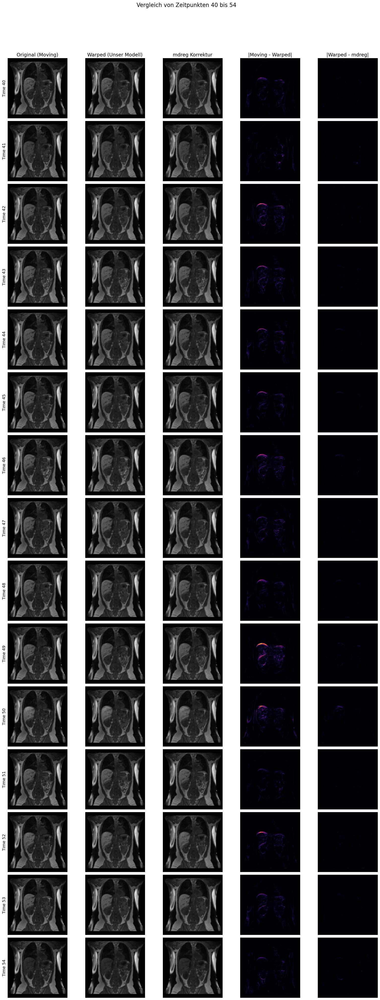

In [53]:
visualize_time_window_comparison_THW(original_valid, warped_valid, coreg_valid, 40)

Zeige 15 Zeitpunkte von 100 bis 114 an...


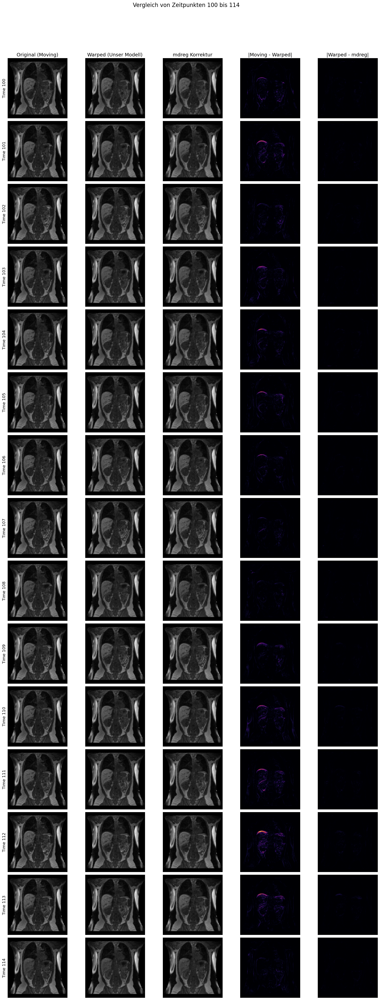

In [54]:
visualize_time_window_comparison_THW(original_valid, warped_valid, coreg_valid, 100)

Zeige 15 Zeitpunkte von 160 bis 174 an...


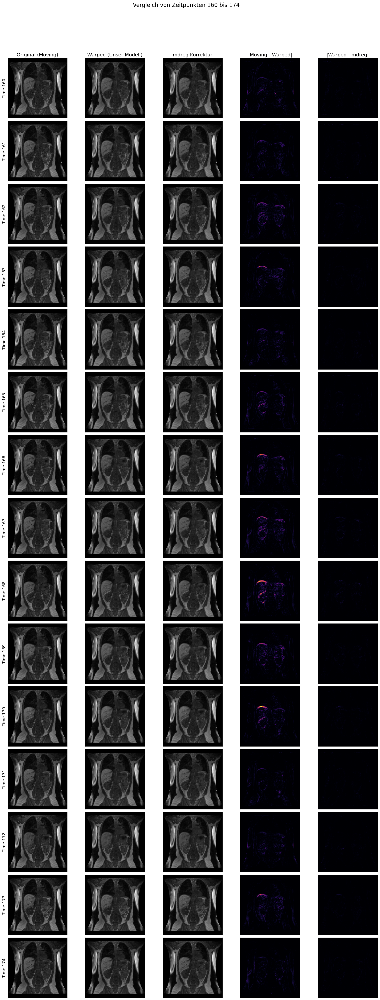

In [55]:
visualize_time_window_comparison_THW(original_valid, warped_valid, coreg_valid, 160)